In [29]:
import os
import numpy as np
from glob import glob
import cv2
import matplotlib.pyplot as plt
from PIL import Image

In [30]:
file_path = "/home/fberanek/Desktop/datasets/segmentation/semantic/soiling_dataset/train/rgbImages/0014_MVL.png"

### Lets see original images

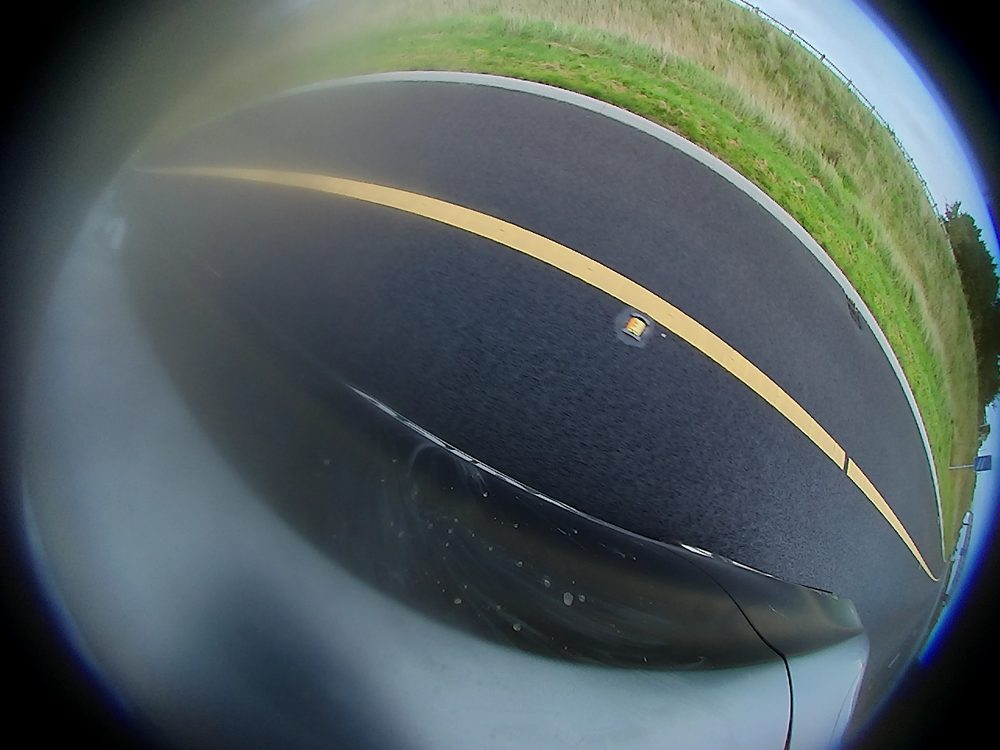

In [31]:
img = Image.open(file_path)
img

In [32]:
img_arr = np.array(img)

### lets see canny edges from images

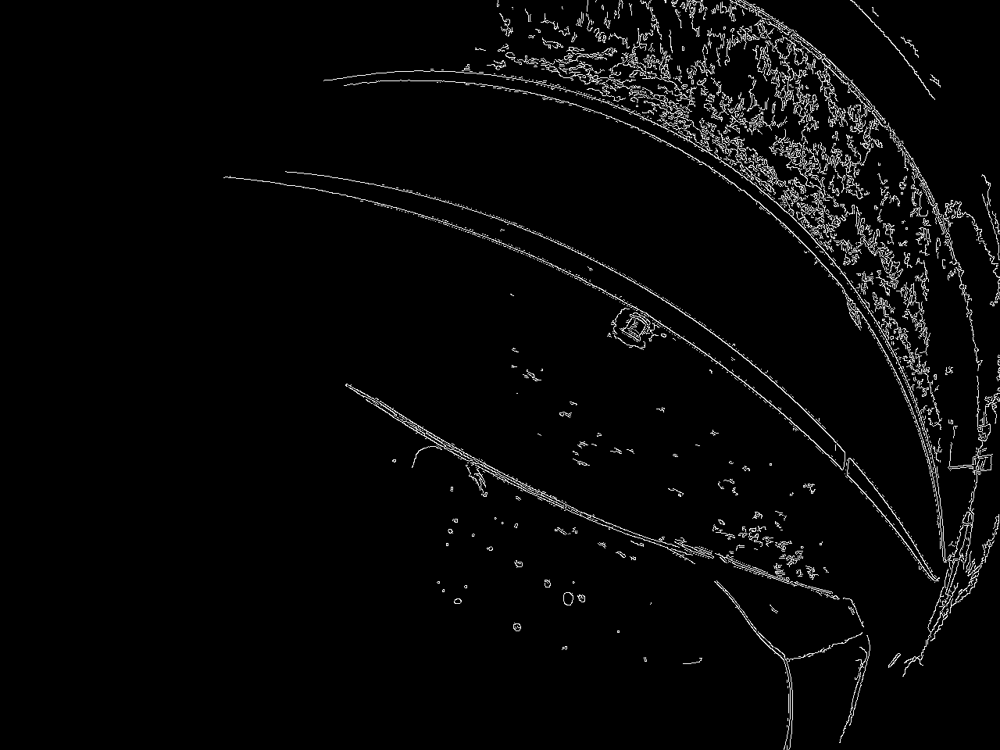

In [33]:
canny = cv2.Canny(np.array(img_arr), 50, 200, None, 3)
Image.fromarray(canny)

### Lets detect Sobel edges

In [34]:
def sobel_image_norm(image):
    grad_norm = (image * 255 / image.max()).astype(np.uint8)
    return grad_norm

In [35]:
sobelx = cv2.Sobel(src=img_arr, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobelx = sobel_image_norm(sobelx)
sobely = cv2.Sobel(src=img_arr, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobely = sobel_image_norm(sobely)
sobelxy = cv2.Sobel(src=img_arr, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
sobelxy = sobel_image_norm(sobelxy)

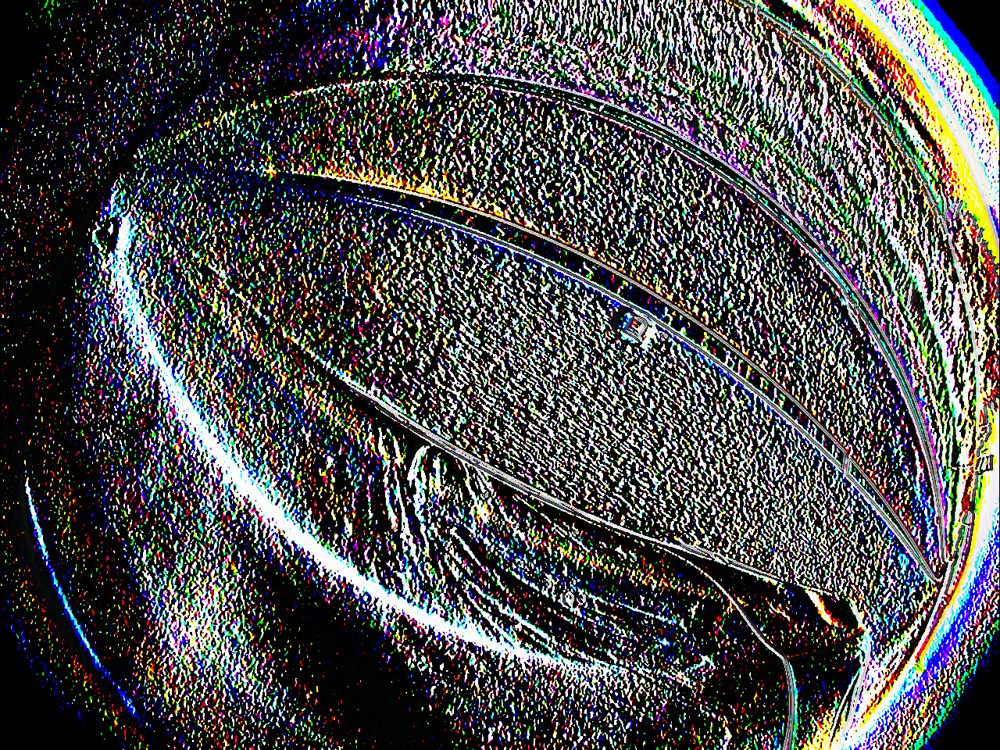

In [36]:
Image.fromarray(sobelx)

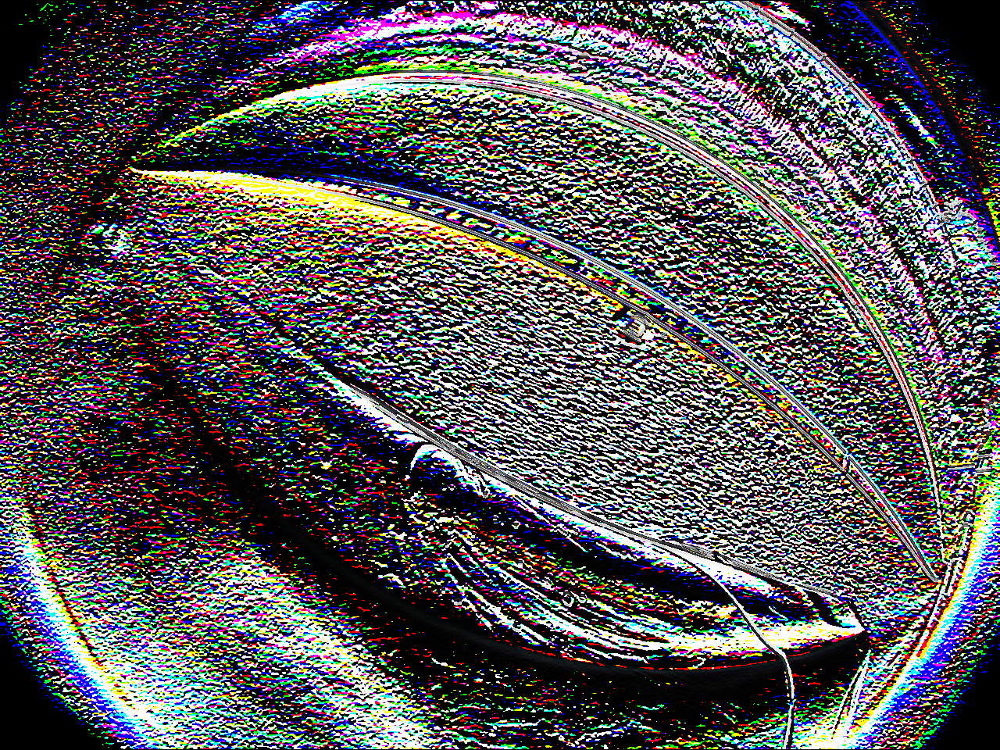

In [37]:
Image.fromarray(sobely)

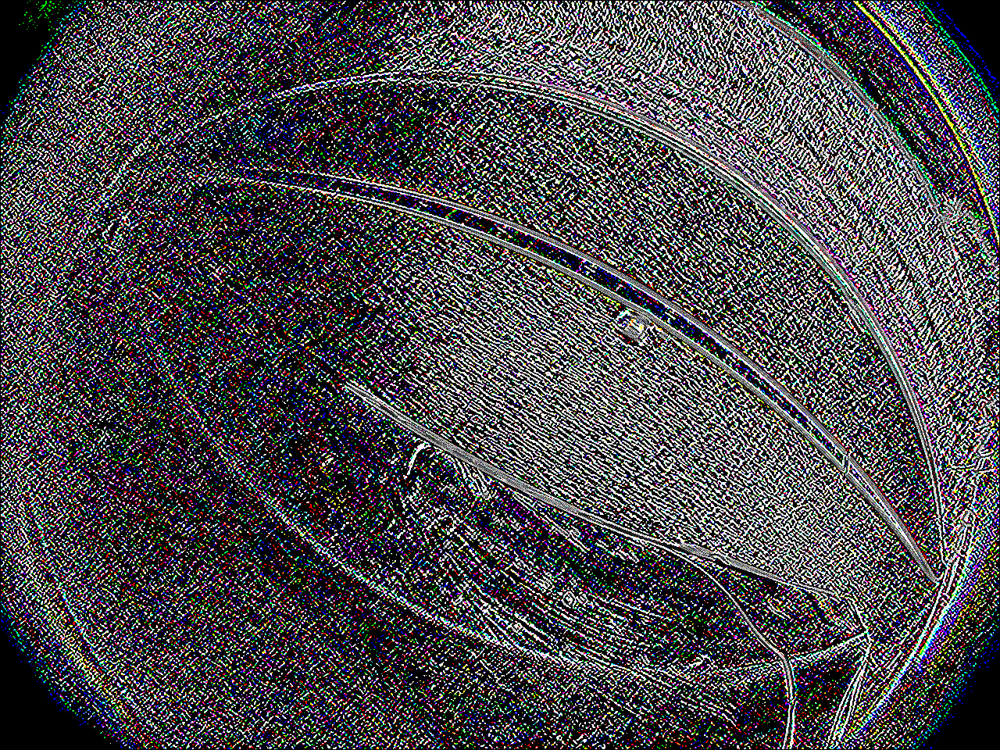

In [38]:
Image.fromarray(sobelxy)

### Apply SIFT points

In [43]:
 # Converting image to grayscale
gray= cv2.cvtColor(img_arr,cv2.COLOR_BGR2GRAY)

# Applying SIFT detector
sift = cv2.SIFT_create()
kp = sift.detect(gray, None)
img_sift=cv2.drawKeypoints(gray ,
                      kp ,
                      img_arr ,
                      flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

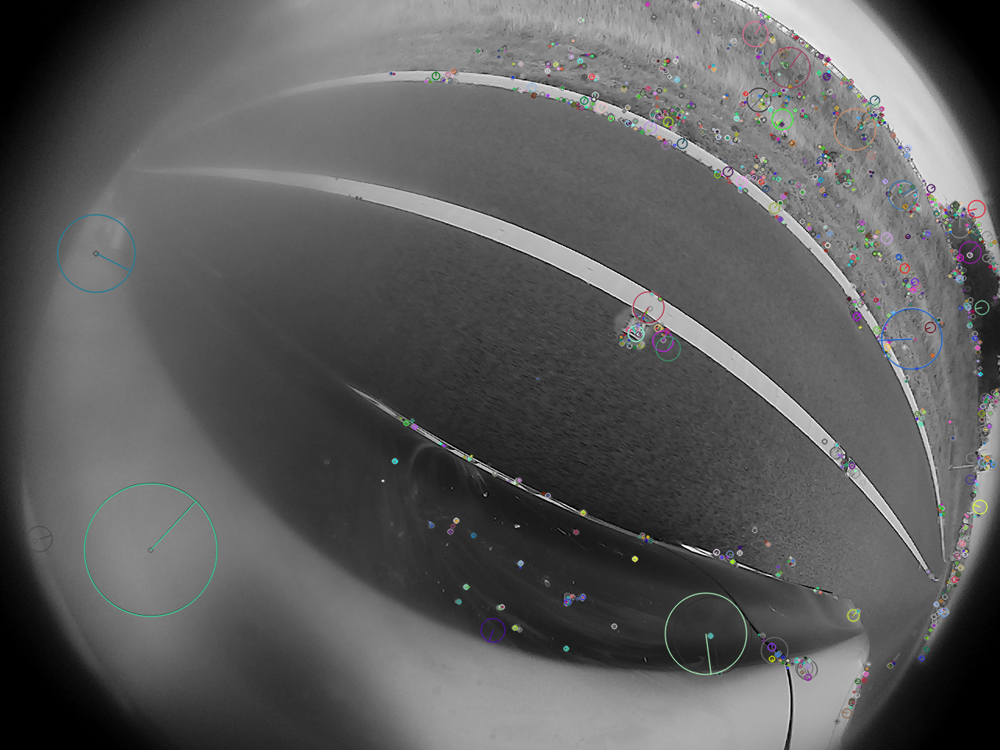

In [44]:
Image.fromarray(img_sift)

### Harris corner

In [47]:
gray = cv2.cvtColor(img_arr,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray,2,3,0.04)
#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)
# Threshold for an optimal value, it may vary depending on the image.
harr_cor = img_arr.copy()
harr_cor[dst>0.01*dst.max()]=[0,0,255]

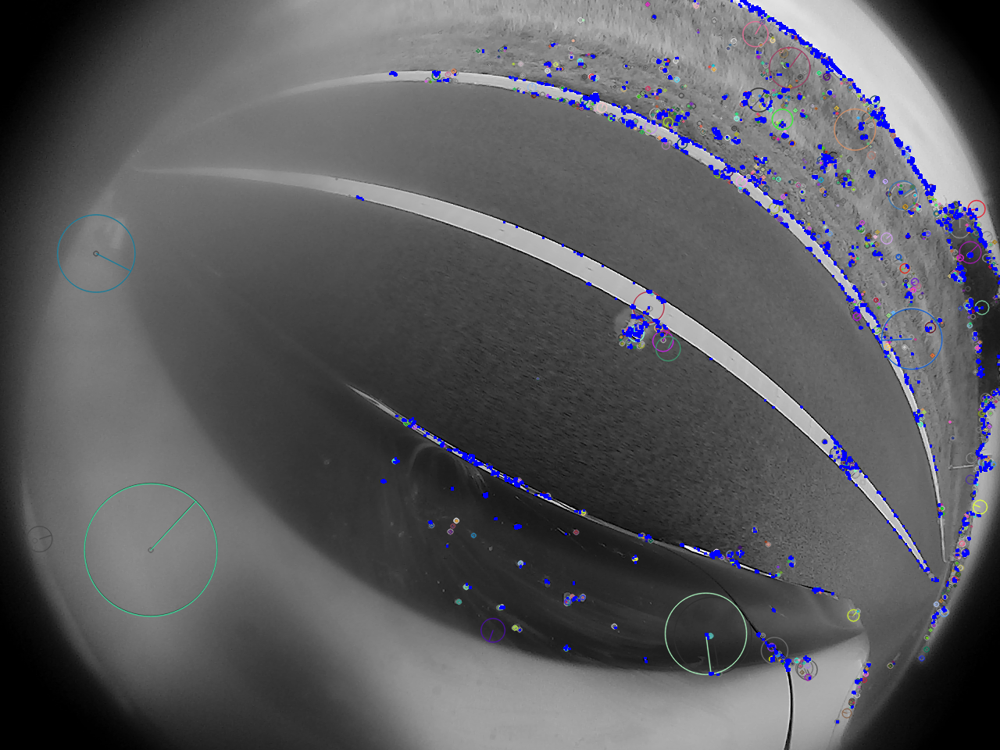

In [48]:
Image.fromarray(harr_cor)